# Draft Final Notebook

## Part 1: Setup

In [1]:
# run helper functions script to load packages, data and functions
%run -i helper_functions.py

Using TensorFlow backend.


In [4]:
# not in helper functions

import seaborn as sns
import cv2
from math import sin, cos, pi

def plot_img(image, label, axis):
    image = image.reshape(96,96)
    axis.imshow(image, cmap='gray')
    axis.scatter(label[0::2], label[1::2], s=24, marker ='.', c='r')

## Part 2: Exploratory Data Analysis

In [7]:
train_data.head()

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,...,nose_tip_y,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y,Image
0,66.033564,39.002274,30.227008,36.421678,59.582075,39.647423,73.130346,39.969997,36.356571,37.389402,...,57.066803,61.195308,79.970165,28.614496,77.388992,43.312602,72.935459,43.130707,84.485774,238 236 237 238 240 240 239 241 241 243 240 23...
1,64.332936,34.970077,29.949277,33.448715,58.856170,35.274349,70.722723,36.187166,36.034723,34.361532,...,55.660936,56.421447,76.352000,35.122383,76.047660,46.684596,70.266553,45.467915,85.480170,219 215 204 196 204 211 212 200 180 168 178 19...
2,65.057053,34.909642,30.903789,34.909642,59.412000,36.320968,70.984421,36.320968,37.678105,36.320968,...,53.538947,60.822947,73.014316,33.726316,72.732000,47.274947,70.191789,47.274947,78.659368,144 142 159 180 188 188 184 180 167 132 84 59 ...
3,65.225739,37.261774,32.023096,37.261774,60.003339,39.127179,72.314713,38.380967,37.618643,38.754115,...,54.166539,65.598887,72.703722,37.245496,74.195478,50.303165,70.091687,51.561183,78.268383,193 192 193 194 194 194 193 192 168 111 50 12 ...
4,66.725301,39.621261,32.244810,38.042032,58.565890,39.621261,72.515926,39.884466,36.982380,39.094852,...,64.889521,60.671411,77.523239,31.191755,76.997301,44.962748,73.707387,44.227141,86.871166,147 148 160 196 215 214 216 217 219 220 206 18...


In [8]:
train_data.shape

(7049, 31)

In [9]:
train_data.columns

Index(['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x',
       'right_eye_center_y', 'left_eye_inner_corner_x',
       'left_eye_inner_corner_y', 'left_eye_outer_corner_x',
       'left_eye_outer_corner_y', 'right_eye_inner_corner_x',
       'right_eye_inner_corner_y', 'right_eye_outer_corner_x',
       'right_eye_outer_corner_y', 'left_eyebrow_inner_end_x',
       'left_eyebrow_inner_end_y', 'left_eyebrow_outer_end_x',
       'left_eyebrow_outer_end_y', 'right_eyebrow_inner_end_x',
       'right_eyebrow_inner_end_y', 'right_eyebrow_outer_end_x',
       'right_eyebrow_outer_end_y', 'nose_tip_x', 'nose_tip_y',
       'mouth_left_corner_x', 'mouth_left_corner_y', 'mouth_right_corner_x',
       'mouth_right_corner_y', 'mouth_center_top_lip_x',
       'mouth_center_top_lip_y', 'mouth_center_bottom_lip_x',
       'mouth_center_bottom_lip_y', 'Image'],
      dtype='object')

In [10]:
train_data.isnull().any().value_counts()

True     28
False     3
dtype: int64

<AxesSubplot:>

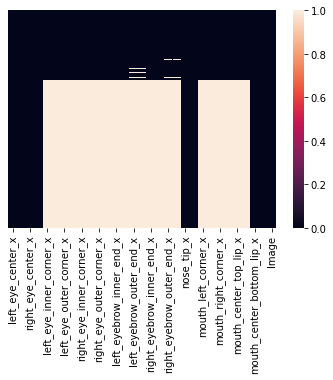

In [11]:
import seaborn as sns

# create heatmap to show data coverage by feature
# black columns have little or no missing data
sns.heatmap(train_data.isnull(),yticklabels = False)

In [12]:
# create loop to store indices of missing data by feature

missing_data_indices = []

for column in train_data[['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x',
       'right_eye_center_y', 'left_eye_inner_corner_x',
       'left_eye_inner_corner_y', 'left_eye_outer_corner_x',
       'left_eye_outer_corner_y', 'right_eye_inner_corner_x',
       'right_eye_inner_corner_y', 'right_eye_outer_corner_x',
       'right_eye_outer_corner_y', 'left_eyebrow_inner_end_x',
       'left_eyebrow_inner_end_y', 'left_eyebrow_outer_end_x',
       'left_eyebrow_outer_end_y', 'right_eyebrow_inner_end_x',
       'right_eyebrow_inner_end_y', 'right_eyebrow_outer_end_x',
       'right_eyebrow_outer_end_y', 'nose_tip_x', 'nose_tip_y',
       'mouth_left_corner_x', 'mouth_left_corner_y', 'mouth_right_corner_x',
       'mouth_right_corner_y', 'mouth_center_top_lip_x',
       'mouth_center_top_lip_y', 'mouth_center_bottom_lip_x',
       'mouth_center_bottom_lip_y']]: 
     
    # Select column contents by column    
    # name using [] operator 
    missing_data_indices.append(train_data[train_data[column].isnull()].index.tolist())
    columnSeriesObj = train_data[column].isnull().sum()
    print('{:<20}     Missing: {:<10,d}     Pct Missing: {:<10.3f}'.format(column, columnSeriesObj, columnSeriesObj/train_data.shape[0]))

left_eye_center_x        Missing: 10             Pct Missing: 0.001     
left_eye_center_y        Missing: 10             Pct Missing: 0.001     
right_eye_center_x       Missing: 13             Pct Missing: 0.002     
right_eye_center_y       Missing: 13             Pct Missing: 0.002     
left_eye_inner_corner_x     Missing: 4,778          Pct Missing: 0.678     
left_eye_inner_corner_y     Missing: 4,778          Pct Missing: 0.678     
left_eye_outer_corner_x     Missing: 4,782          Pct Missing: 0.678     
left_eye_outer_corner_y     Missing: 4,782          Pct Missing: 0.678     
right_eye_inner_corner_x     Missing: 4,781          Pct Missing: 0.678     
right_eye_inner_corner_y     Missing: 4,781          Pct Missing: 0.678     
right_eye_outer_corner_x     Missing: 4,781          Pct Missing: 0.678     
right_eye_outer_corner_y     Missing: 4,781          Pct Missing: 0.678     
left_eyebrow_inner_end_x     Missing: 4,779          Pct Missing: 0.678     
left_eyebrow_inner_

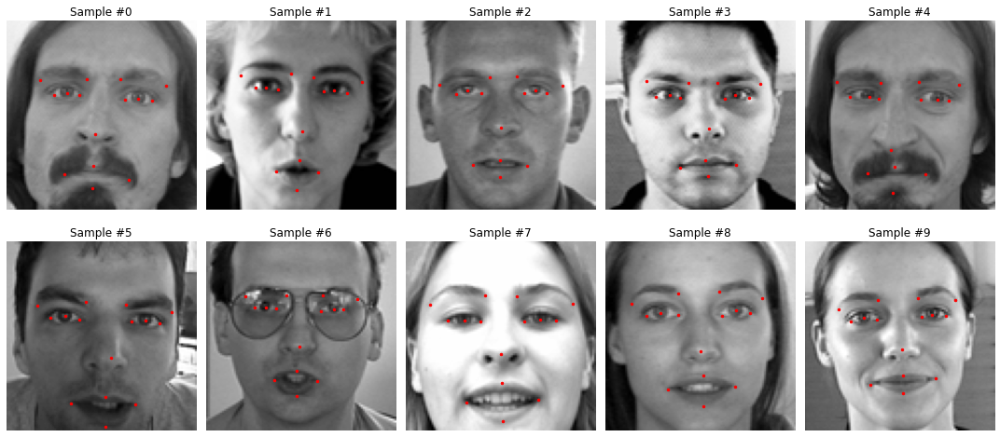

In [13]:
# show examples of images with marks for facial keypoints
show_images(train_data, range(10))

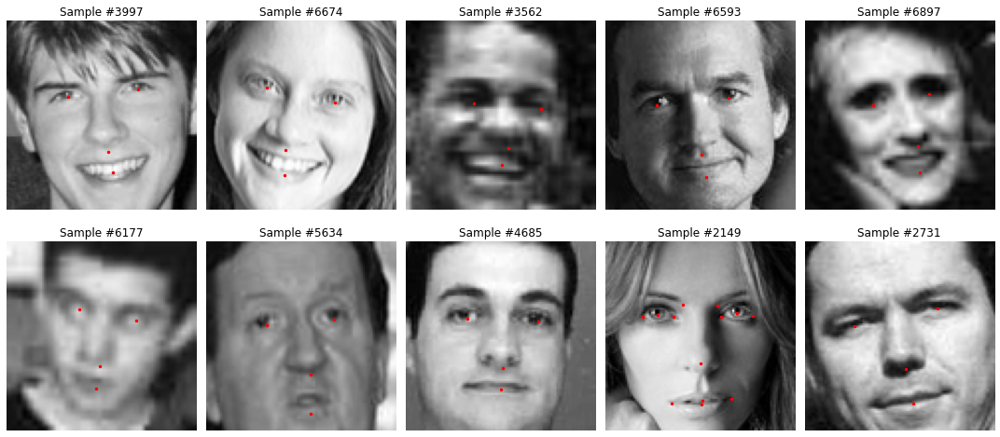

In [14]:
# show examples of images with missing data
missing_any_data = train_data[train_data.isnull().any(axis=1)]
idxs = np.random.choice(missing_any_data.index, 10)
show_images(train_data, idxs)


Examples of images missing left_eye_center_x


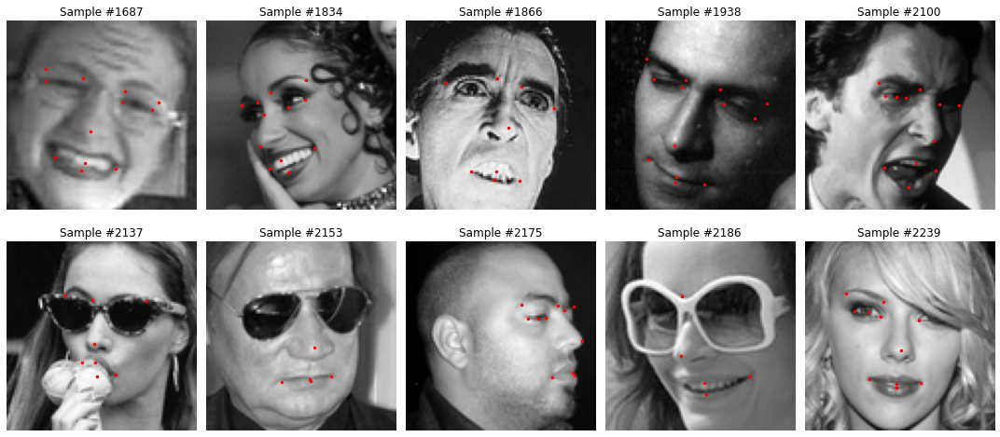


Examples of images missing left_eye_center_y


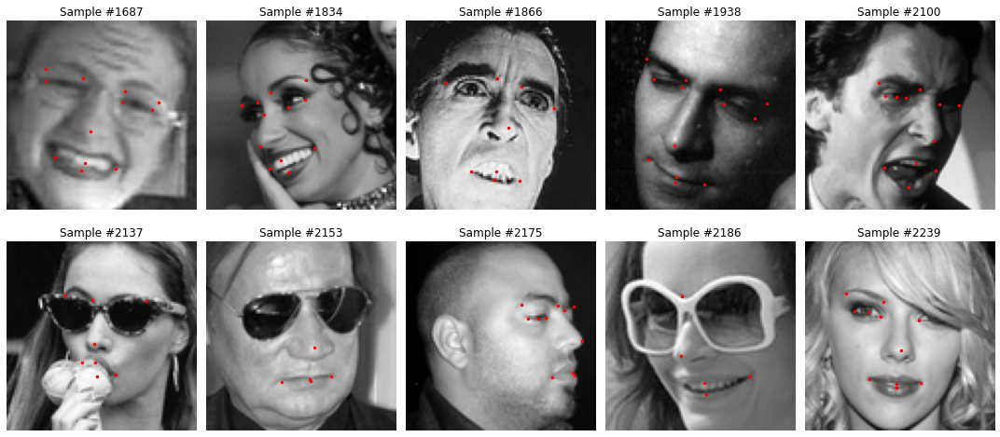


Examples of images missing right_eye_center_x


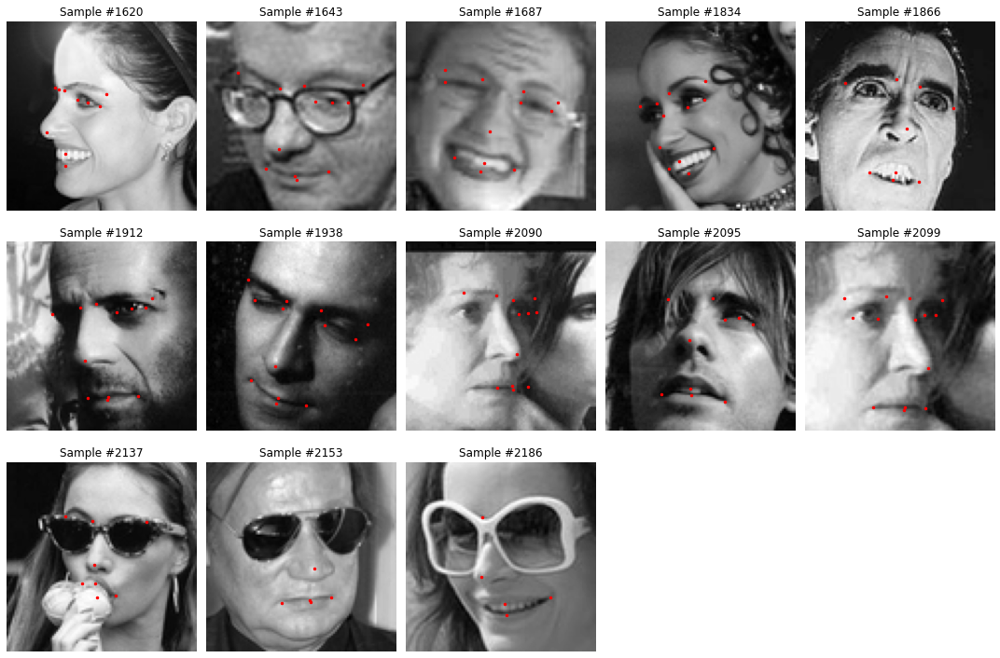


Examples of images missing right_eye_center_y


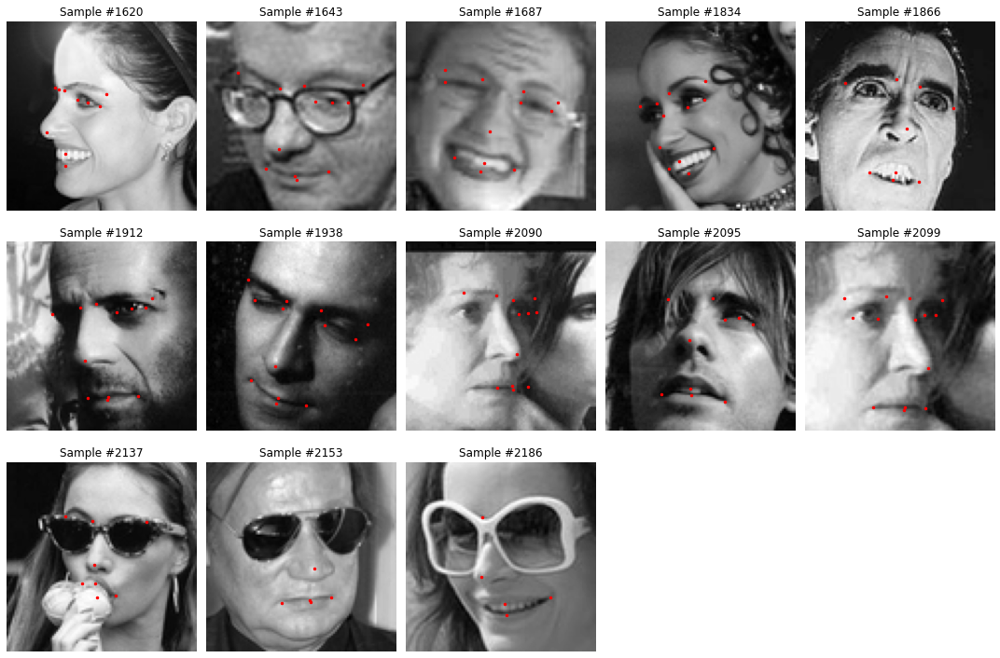


Examples of images missing left_eye_inner_corner_x


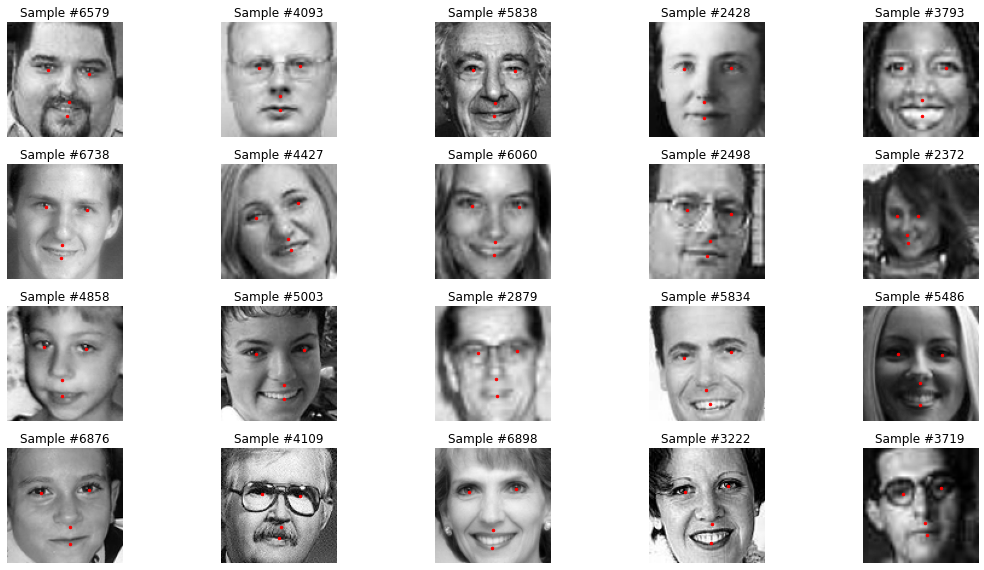


Examples of images missing left_eye_inner_corner_y


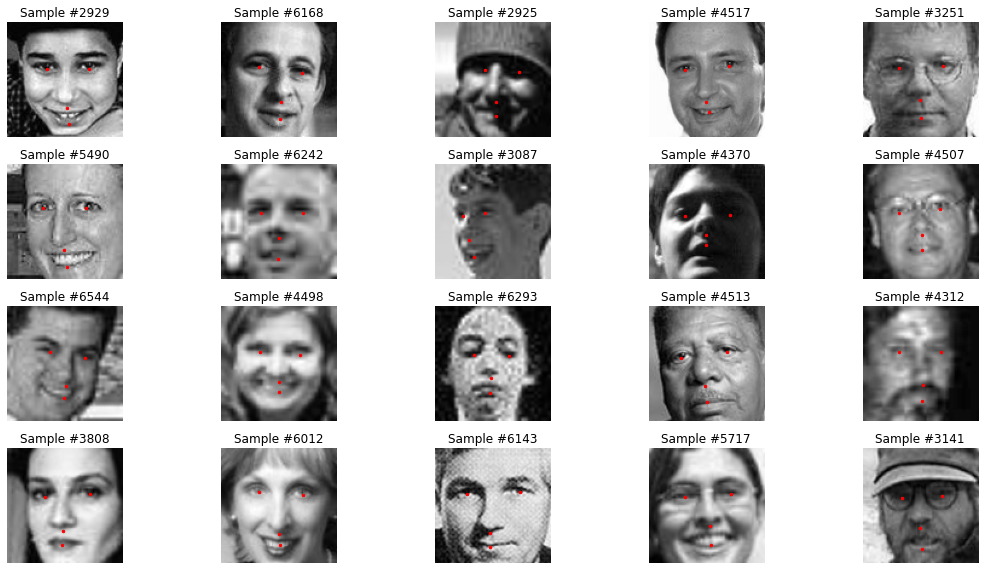


Examples of images missing left_eye_outer_corner_x


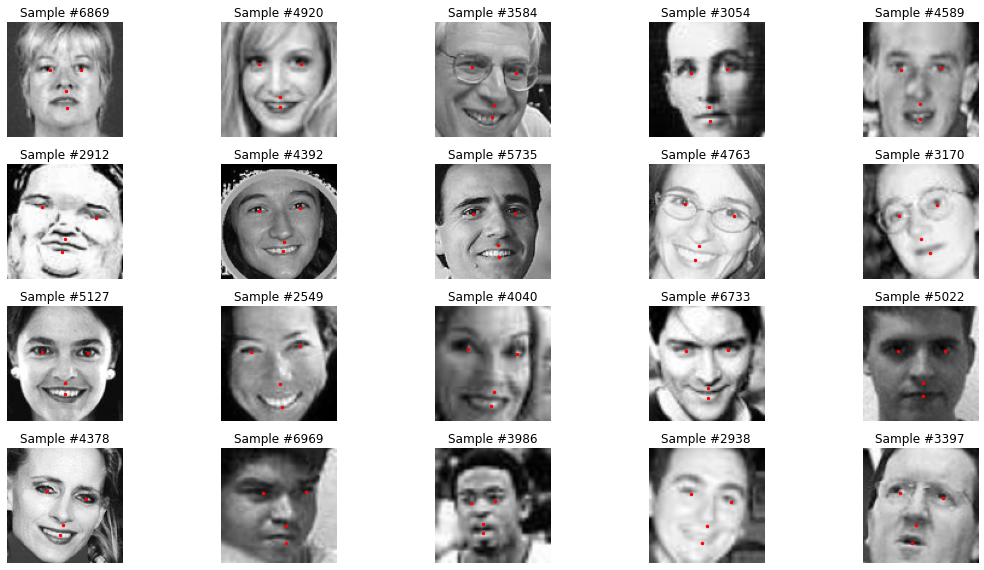


Examples of images missing left_eye_outer_corner_y


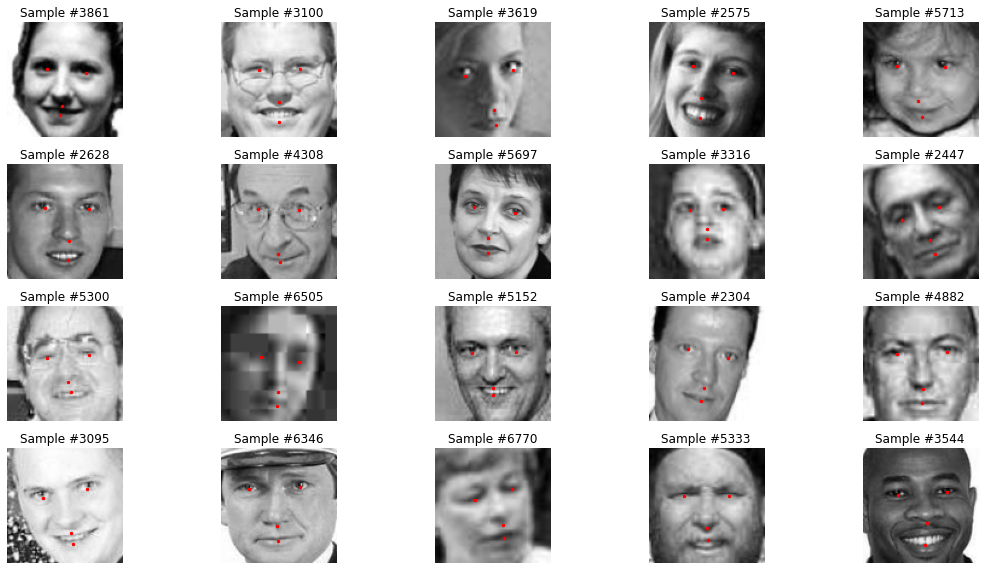


Examples of images missing right_eye_inner_corner_x


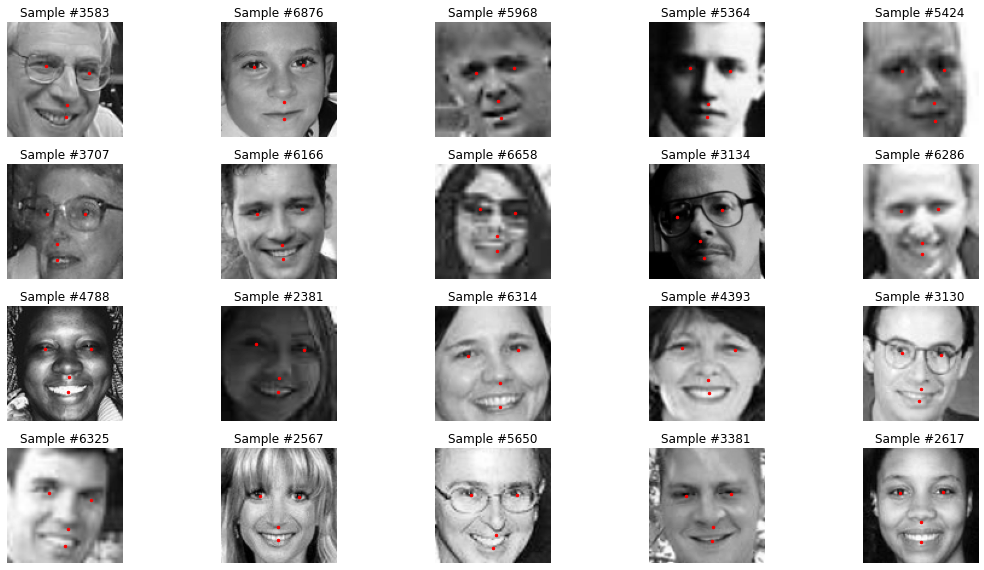


Examples of images missing right_eye_inner_corner_y


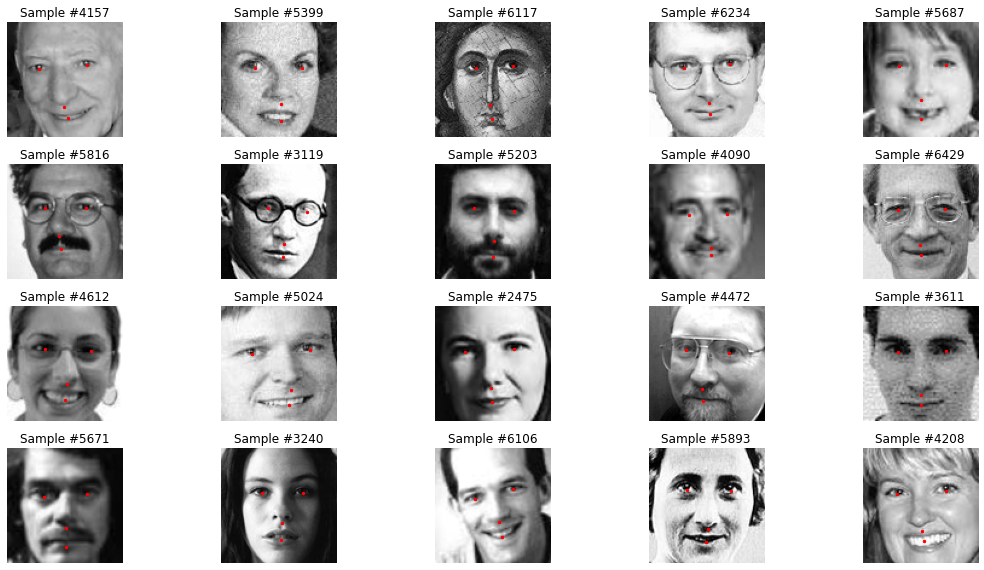


Examples of images missing right_eye_outer_corner_x


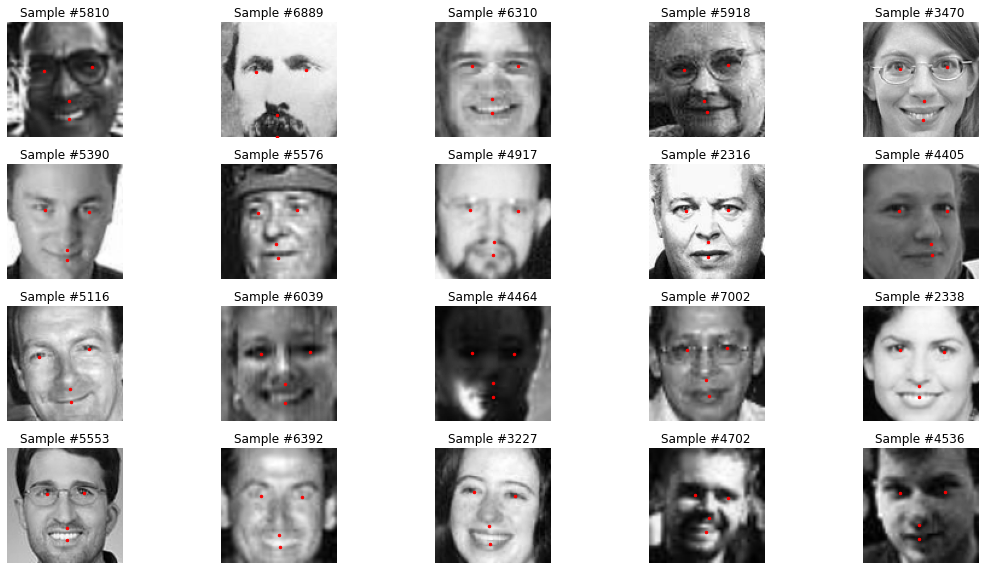


Examples of images missing right_eye_outer_corner_y


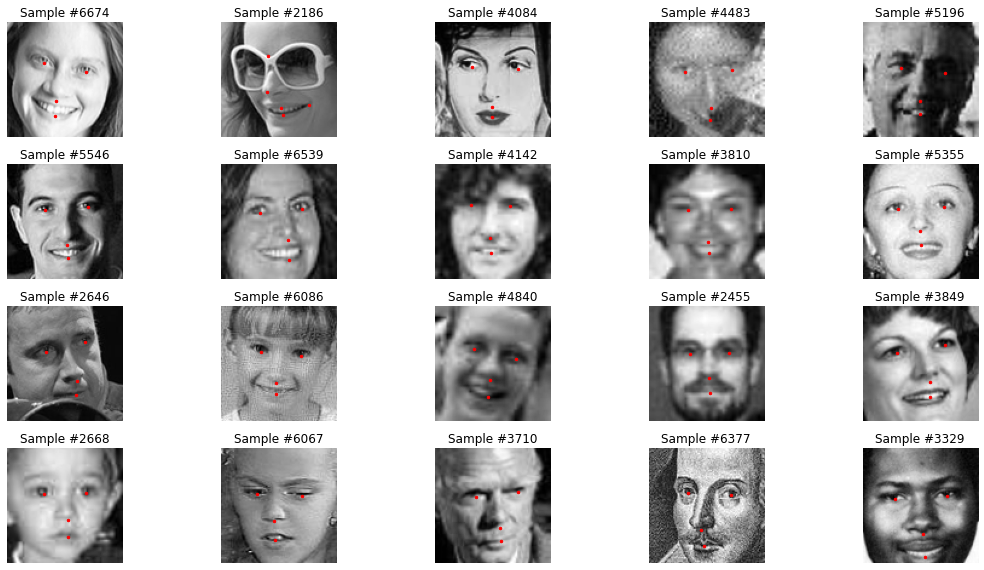


Examples of images missing left_eyebrow_inner_end_x


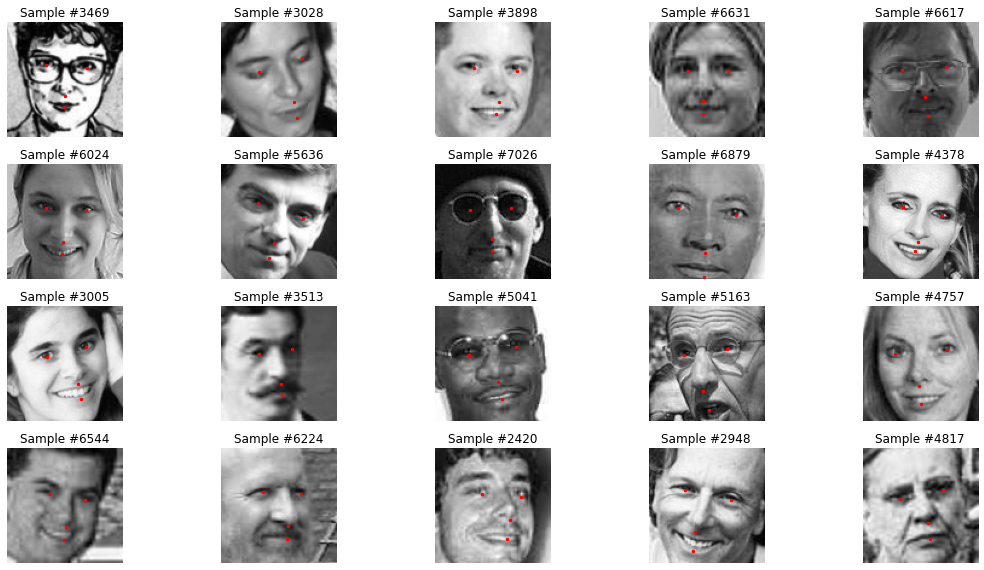


Examples of images missing left_eyebrow_inner_end_y


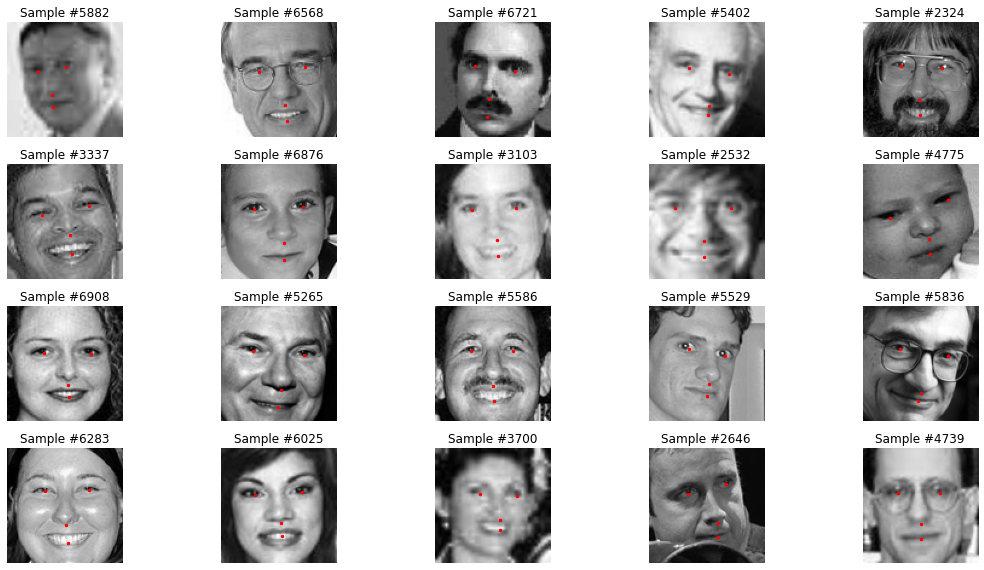


Examples of images missing left_eyebrow_outer_end_x


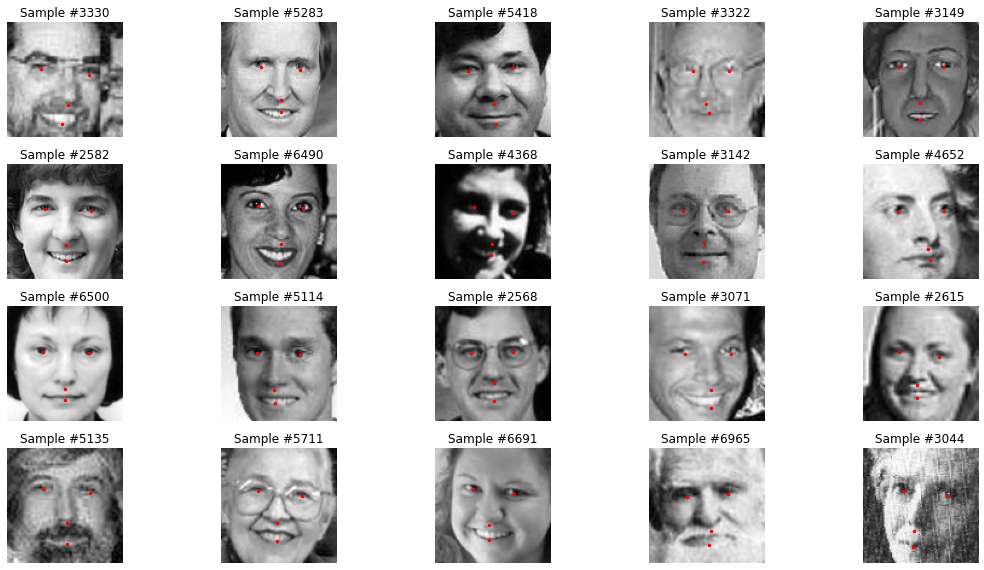


Examples of images missing left_eyebrow_outer_end_y


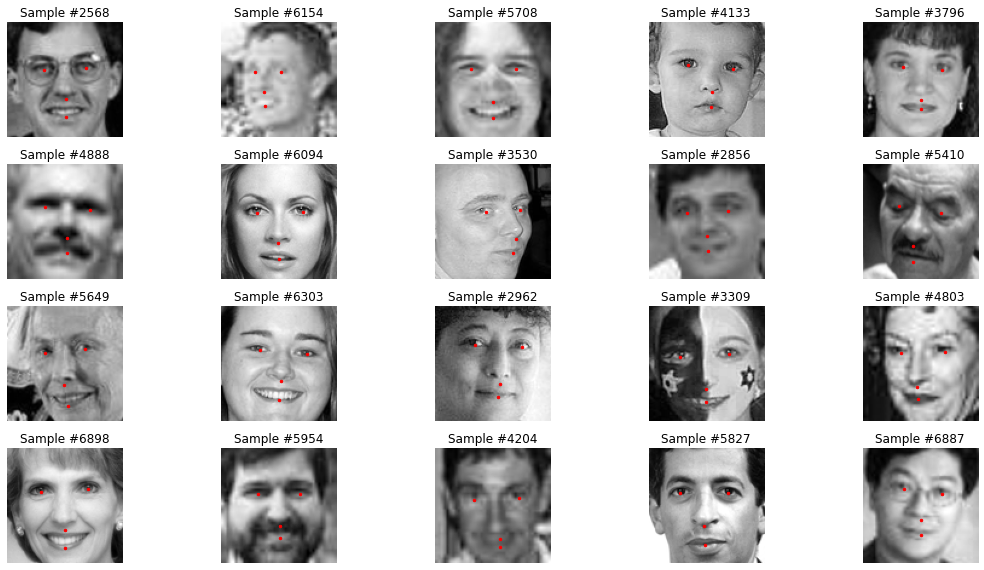


Examples of images missing right_eyebrow_inner_end_x


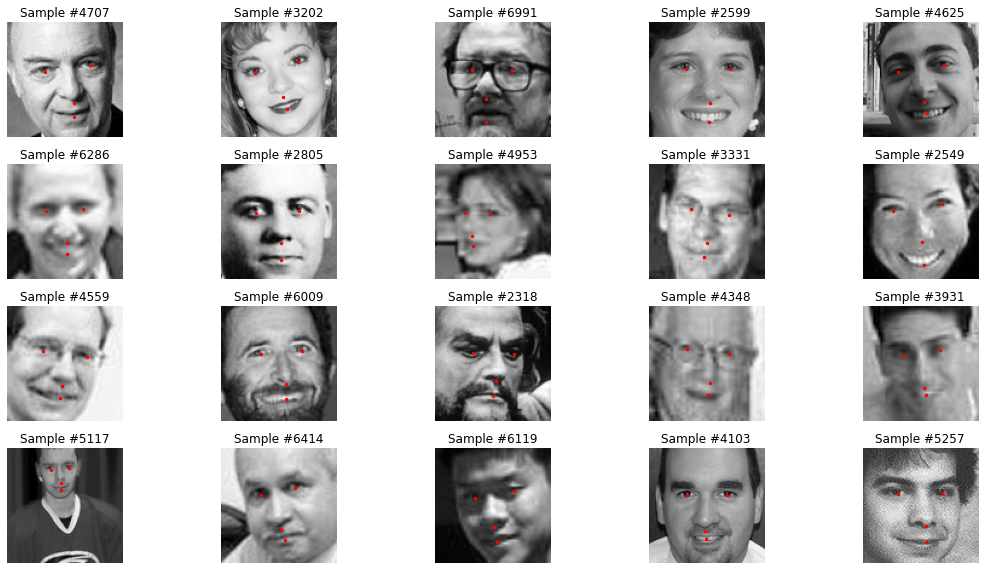


Examples of images missing right_eyebrow_inner_end_y


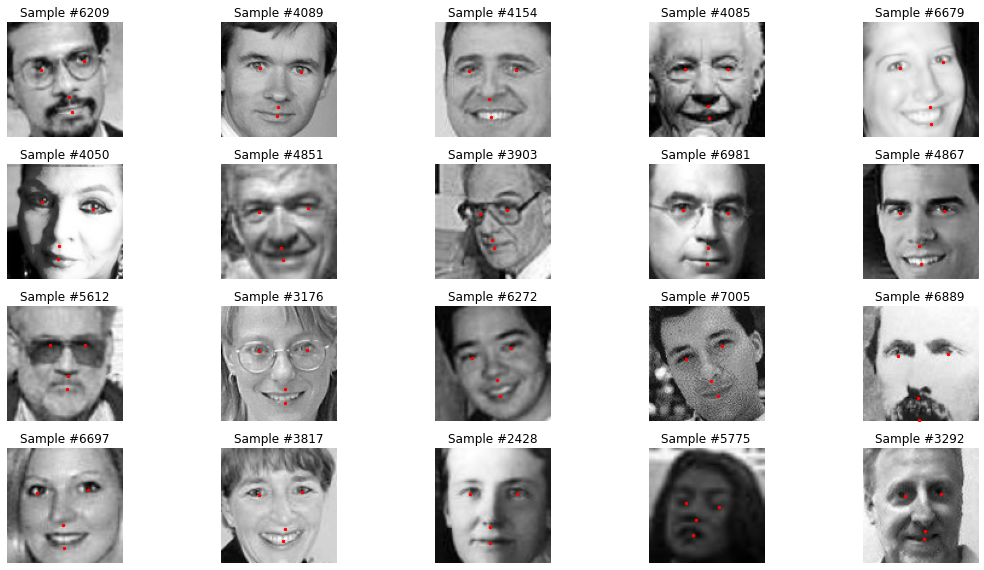


Examples of images missing right_eyebrow_outer_end_x


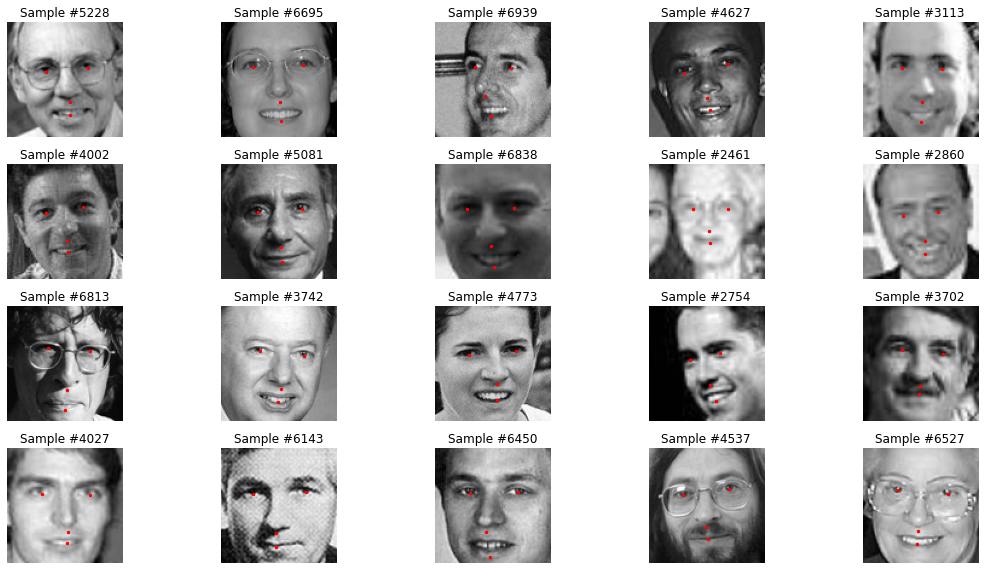


Examples of images missing right_eyebrow_outer_end_y


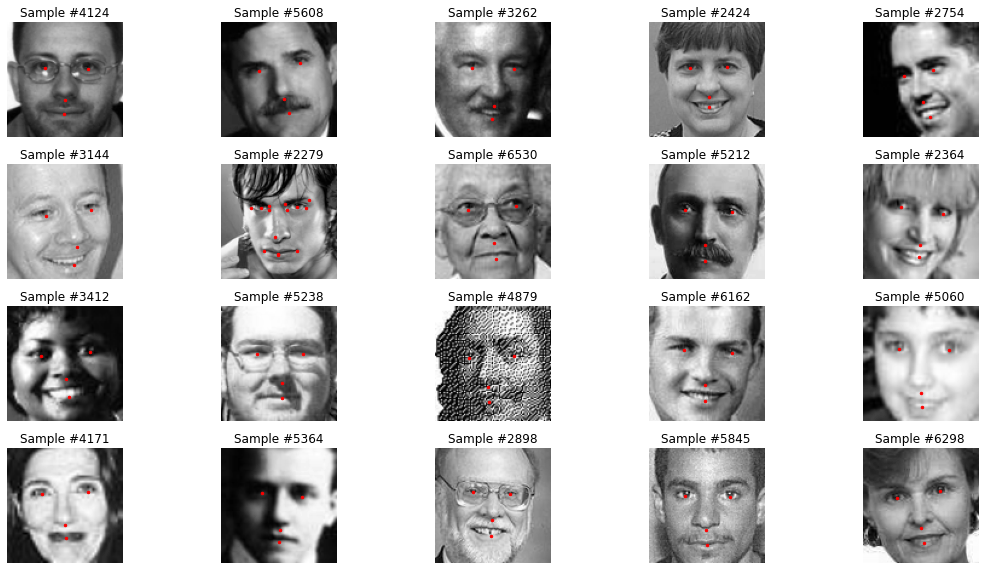


Examples of images missing mouth_left_corner_x


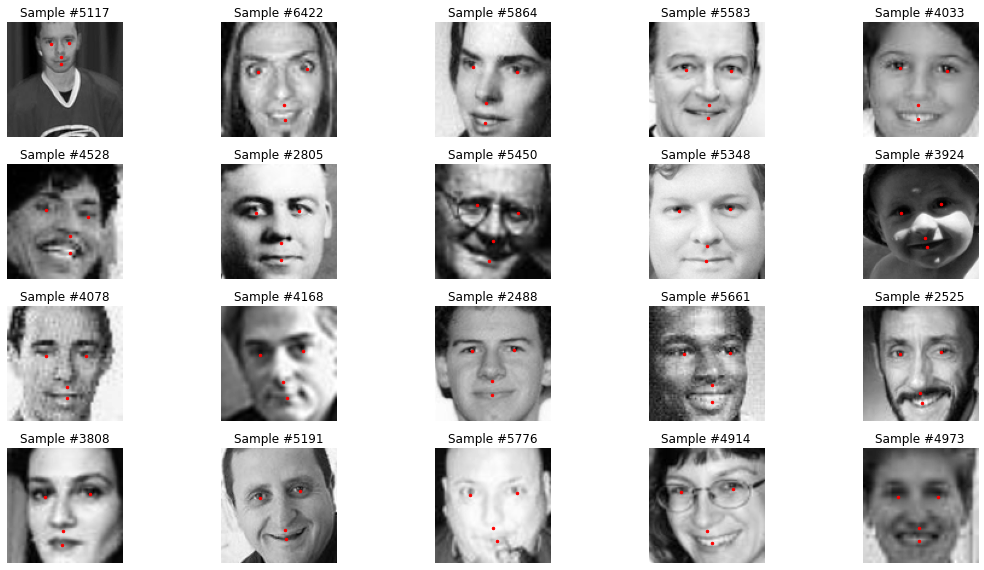


Examples of images missing mouth_left_corner_y


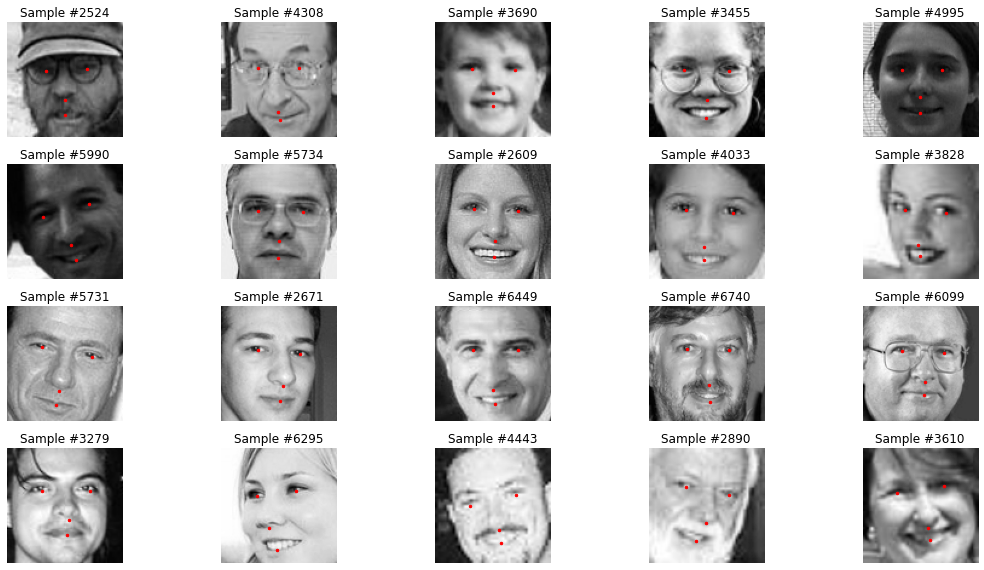


Examples of images missing mouth_right_corner_x


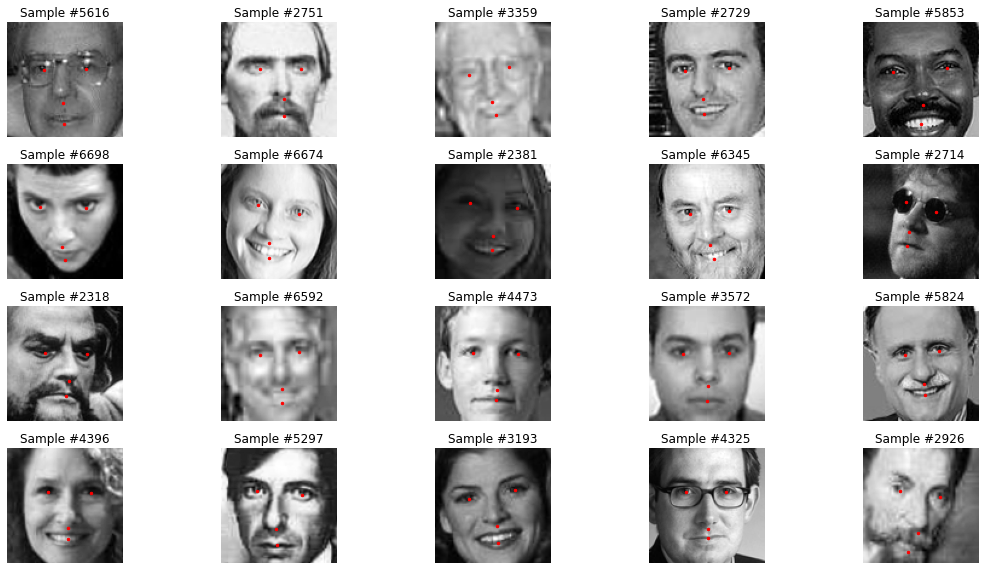


Examples of images missing mouth_right_corner_y


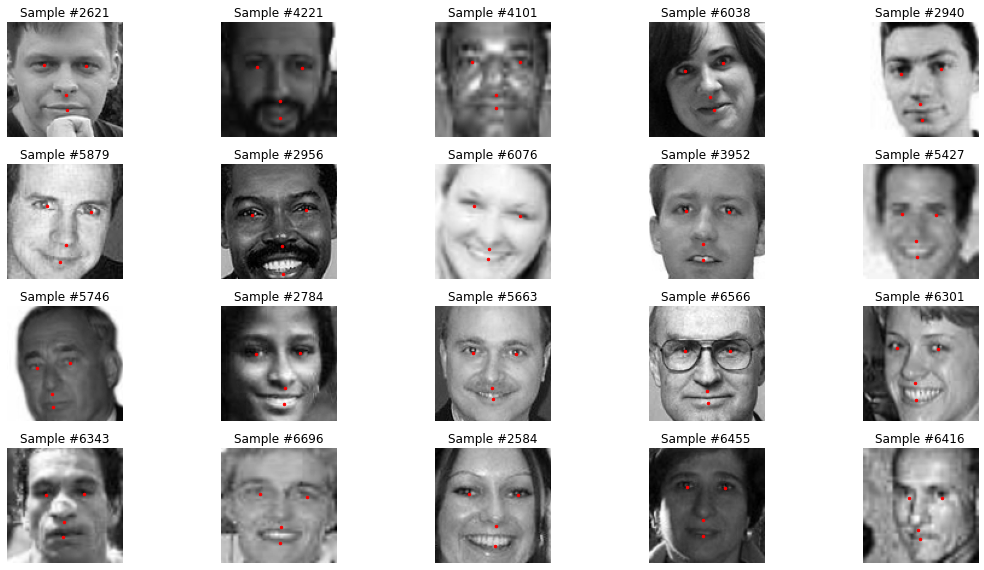


Examples of images missing mouth_center_top_lip_x


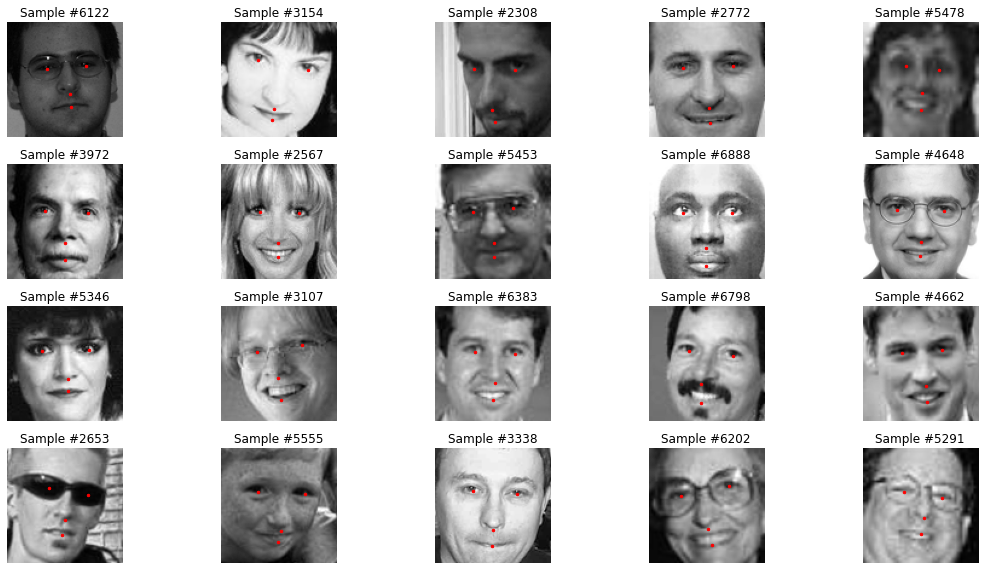


Examples of images missing mouth_center_top_lip_y


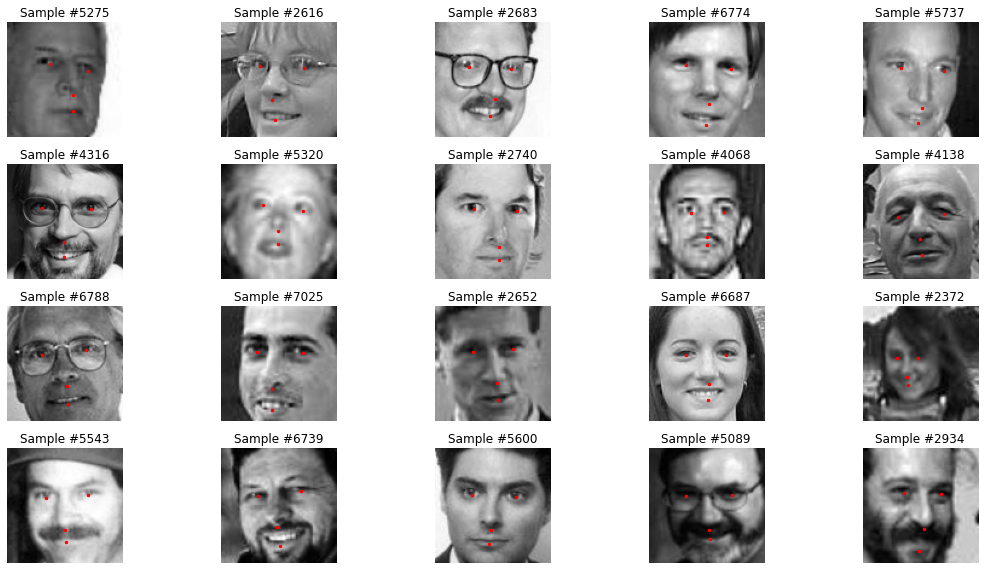


Examples of images missing mouth_center_bottom_lip_x


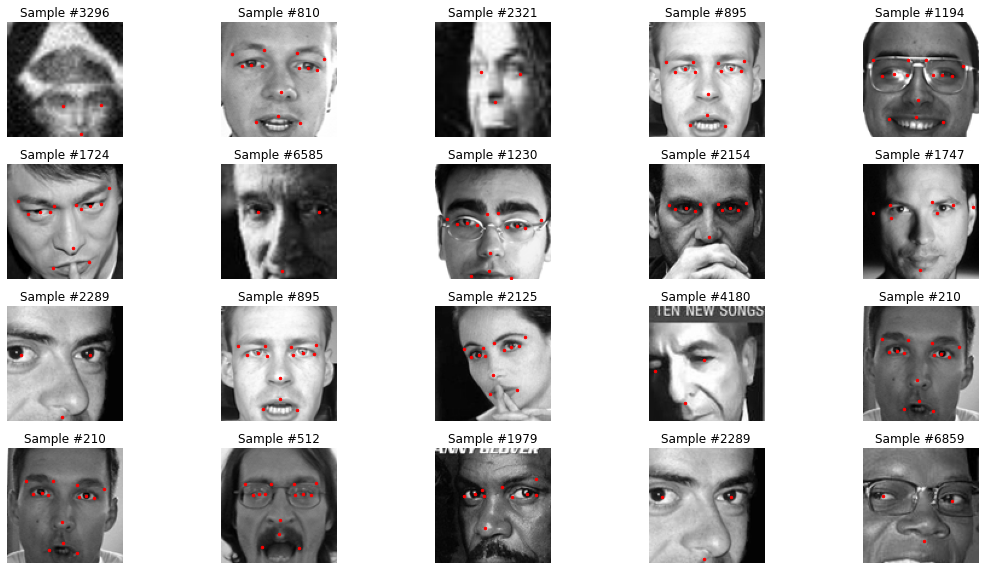


Examples of images missing mouth_center_bottom_lip_y


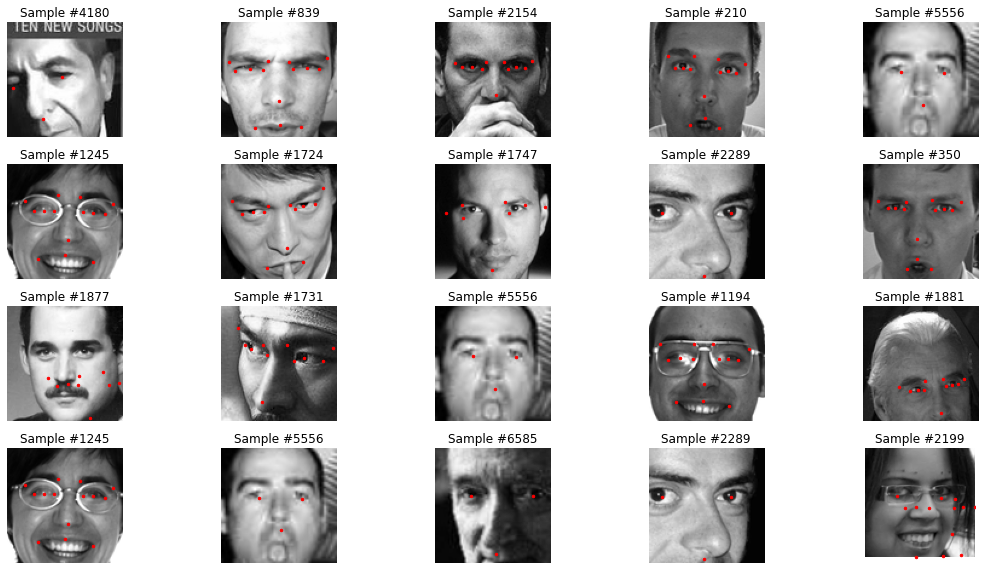

CPU times: user 44.6 s, sys: 4.34 s, total: 49 s
Wall time: 42.1 s


In [15]:
%%time
# show examples of up to 20 images with missing data for each column

column_labels = ['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x',
       'right_eye_center_y', 'left_eye_inner_corner_x',
       'left_eye_inner_corner_y', 'left_eye_outer_corner_x',
       'left_eye_outer_corner_y', 'right_eye_inner_corner_x',
       'right_eye_inner_corner_y', 'right_eye_outer_corner_x',
       'right_eye_outer_corner_y', 'left_eyebrow_inner_end_x',
       'left_eyebrow_inner_end_y', 'left_eyebrow_outer_end_x',
       'left_eyebrow_outer_end_y', 'right_eyebrow_inner_end_x',
       'right_eyebrow_inner_end_y', 'right_eyebrow_outer_end_x',
       'right_eyebrow_outer_end_y', 'nose_tip_x', 'nose_tip_y',
       'mouth_left_corner_x', 'mouth_left_corner_y', 'mouth_right_corner_x',
       'mouth_right_corner_y', 'mouth_center_top_lip_x',
       'mouth_center_top_lip_y', 'mouth_center_bottom_lip_x',
       'mouth_center_bottom_lip_y']

for i in range(len(column_labels)):
    if len(missing_data_indices[i]) == 0:
        continue
    elif len(missing_data_indices[i]) <=20:
        print("\nExamples of images missing {}".format(column_labels[i]))
        show_images(train_data, missing_data_indices[i])
    else:
        print("\nExamples of images missing {}".format(column_labels[i]))
        rnd_ind = np.random.choice(missing_data_indices[i], 20)
        show_images(train_data, rnd_ind)

In [16]:
# confirm whether there is any missing data for only of the x,y coordinates
# associated with a facial keypoint

len(missing_data_indices)
for i in range(0, 30, 2):
    a = missing_data_indices[i]==missing_data_indices[i+1]
    print("i = {}; {}".format(i, a))

i = 0; True
i = 2; True
i = 4; True
i = 6; True
i = 8; True
i = 10; True
i = 12; True
i = 14; True
i = 16; True
i = 18; True
i = 20; True
i = 22; True
i = 24; True
i = 26; True
i = 28; True


## Part 3: Create training data scenarios based on options to handle missing values

In [17]:
# create 'partial' (missing values) dataset from train_data

train_data_partial = train_data.dropna()
print("Shape of training dataset with no missing values: {}".format(train_data_partial.shape))

Shape of training dataset with no missing values: (2140, 31)


In [18]:
%%time

# separate data into features and labels using helper functions

X_full = get_features(train_data, dim=2)
y_full = get_labels(train_data)
X_test = get_features(test_data, dim=2)

print("Full training data with missing values:")
print("Training features shape: {}".format(X_full.shape))
print("Training labels shape: {}".format(y_full.shape))
print("Test features shape: {}".format(X_test.shape))

Full training data with missing values:
Training features shape: (7049, 96, 96, 1)
Training labels shape: (7049, 30)
Test features shape: (1783, 96, 96, 1)
CPU times: user 20.7 s, sys: 4.99 s, total: 25.7 s
Wall time: 25.7 s


In [19]:
%%time

# drop rows with missing values
# get features function didn't work after rows were dropped

def load_images(image_data):
    images = []
    for idx, df in image_data.iterrows():
        image = np.array(df['Image'].split(' '), dtype=int)
        image = np.reshape(image, (96,96,1))
        images.append(image)
    images = np.array(images)
    return images

X_partial = load_images(train_data_partial)

y_partial = train_data_partial.drop("Image", axis = 1).to_numpy()

print("Partial training data with NO missing values:")
print("Training features shape: {}".format(X_partial.shape))
print("Training labels shape: {}".format(y_partial.shape))

Partial training data with NO missing values:
Training features shape: (2140, 96, 96, 1)
Training labels shape: (2140, 30)
CPU times: user 3.95 s, sys: 0 ns, total: 3.95 s
Wall time: 3.95 s


In [20]:
# image pixels not yet normalized.  Need to divide by 255.
# consider adding as a helper function

def convert_images(image_data):
    temp = np.array(image_data)/255
    return temp

X_full_converted = convert_images(X_full)
X_partial_converted = convert_images(X_partial)
X_test_converted = convert_images(X_test)

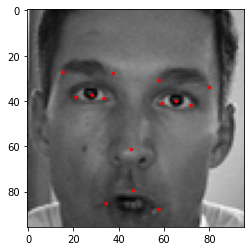

In [21]:
fig, axis = plt.subplots()
plot_img(X_full_converted[210], y_full[210], axis)

In [22]:
# create function to flip images horizontally

def flip_horizontal(features, labels):
    flipped_labels = []
    flipped_features = np.flip(features, axis=2)
    for index, value in enumerate(labels):
        flipped_labels.append([96.-coor if index%2==0 else coor for index, coor in enumerate(value)])
    return flipped_features, np.asarray(flipped_labels)

In [23]:
%%time
test_feat, test_lab = flip_horizontal(X_full_converted, y_full)
print(test_feat.shape)
print(test_lab.shape)

(7049, 96, 96, 1)
(7049, 30)
CPU times: user 80 ms, sys: 0 ns, total: 80 ms
Wall time: 79.1 ms


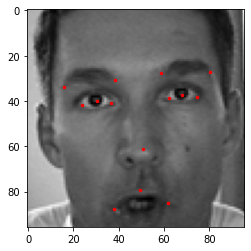

In [24]:
# show example
fig, axis = plt.subplots()
plot_img(test_feat[210], test_lab[210], axis)

In [25]:
print(type(X_full_converted), X_full_converted.shape)
print(type(X_partial_converted), X_partial_converted.shape)
print(type(y_full), y_full.shape)
print(type(y_partial), y_partial.shape)

<class 'numpy.ndarray'> (7049, 96, 96, 1)
<class 'numpy.ndarray'> (2140, 96, 96, 1)
<class 'numpy.ndarray'> (7049, 30)
<class 'numpy.ndarray'> (2140, 30)


In [26]:
test_feat2, test_lab2 = flip_horizontal(X_partial_converted, y_partial)
print(test_feat2.shape)
print(test_lab2.shape)

(2140, 96, 96, 1)
(2140, 30)


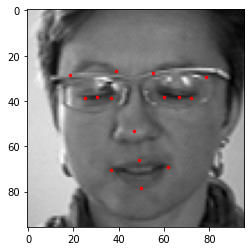

In [27]:
# show example
fig, axis = plt.subplots()
plot_img(test_feat2[210], test_lab2[210], axis)

In [28]:
# create function to rotate images
# https://in.mathworks.com/matlabcentral/answers/93554-how-can-i-rotate-a-set-of-points-in-a-plane-by-a-certain-angle-about-an-arbitrary-point

# arbitary list of angles to use to rotate the images
angle_list = [5, 7.5, 10, 12.5, 15] 

def perform_rotation(features, labels):
    rotated_labels = []
    rotated_features = []
    for item in angle_list:    
        for angle in [item,-item]:
            M = cv2.getRotationMatrix2D((48,48), angle, 1.0)
            angle_radians = -angle*pi/180. 
            
            # features
            for feat in features:
                rotated_feat = cv2.warpAffine(feat, M, (96,96), flags=cv2.INTER_CUBIC)
                rotated_features.append(rotated_feat)
            
            # labels
            for lab in labels:
                rotated_lab = lab - 48.
                for idx in range(0,len(rotated_lab),2):
                    rotated_lab[idx] = rotated_lab[idx]*cos(angle_radians)-rotated_lab[idx+1]*sin(angle_radians)
                    rotated_lab[idx+1] = rotated_lab[idx]*sin(angle_radians)+rotated_lab[idx+1]*cos(angle_radians)
                rotated_lab += 48.   # Add the earlier subtracted value
                rotated_labels.append(rotated_lab)
            
    return np.reshape(rotated_features,(-1,96,96,1)), np.asarray(rotated_labels)

In [29]:
%%time
test_feat, test_lab = perform_rotation(X_full_converted, y_full)
print(test_feat.shape)
print(test_lab.shape)

(70490, 96, 96, 1)
(70490, 30)
CPU times: user 18.4 s, sys: 5.63 s, total: 24.1 s
Wall time: 24.3 s


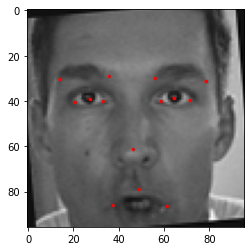

In [30]:
# show example
fig, axis = plt.subplots()
plot_img(test_feat[210], test_lab[210], axis)

In [31]:
# create function to update image lighting

# arbitrary list of lighting factors to use to brighten/dim the images
lighting_factor_list = [0.5, 0.75, 1.25, 1.5]

def update_lighting(features, labels):
    updated_features = []
    updated_labels = []
    for item in lighting_factor_list:
        new_features = np.clip(features*item, 0.0, 1.0)
        updated_features.extend(new_features)
        updated_labels.extend(labels)
    return np.asarray(updated_features), np.asarray(updated_labels)

In [32]:
%%time
test_feat, test_lab = update_lighting(X_full_converted, y_full)
print(test_feat.shape)
print(test_lab.shape)

(28196, 96, 96, 1)
(28196, 30)
CPU times: user 1.35 s, sys: 12 ms, total: 1.36 s
Wall time: 1.36 s


In [33]:
# create function to move the center of the image up, down, left and right

# arbitrary list of pixel values to use to move center of image
pixel_moves = [4, 8, 16, 32]

def move_center(features, labels):
    shifted_features = []
    shifted_labels = []
    for item in pixel_moves:
        for (xval,yval) in [(item,item),(-item,item),(item,-item),(-item,-item)]:
            M = np.float32([[1,0,xval],[0,1,yval]])
            for feat, lab in zip(features, labels):
                shifted_feature = cv2.warpAffine(feat, M, (96,96), flags=cv2.INTER_CUBIC)
                shifted_label = np.array([(point+xval) if idx%2==0 else (point+yval) for idx, point in enumerate(lab)])
                if np.all(0.0<shifted_label) and np.all(shifted_label<96.0):
                    shifted_features.append(shifted_feature.reshape(96,96,1))
                    shifted_labels.append(shifted_label)
    shifted_labels = np.clip(shifted_labels,0.0,96.0)
    return np.asarray(shifted_features), shifted_labels

In [34]:
%%time
test_feat, test_lab = move_center(X_full_converted, y_full)
print(test_feat.shape)
print(test_lab.shape)

(19278, 96, 96, 1)
(19278, 30)
CPU times: user 26.5 s, sys: 0 ns, total: 26.5 s
Wall time: 26.5 s


In [36]:
# create function to add noise to images

# arbitrary noise factor
noise_factor = 0.02

def add_noise(features, labels):
    noise_features = []
    for feat in features:
        noise_feat = cv2.add(feat, noise_factor*np.random.randn(96,96,1))
        noise_features.append(noise_feat.reshape(96,96,1))
    return np.asarray(noise_features), labels

In [37]:
%%time
test_feat, test_lab = add_noise(X_full_converted, y_full)
print(test_feat.shape)
print(test_lab.shape)

(7049, 96, 96, 1)
(7049, 30)
CPU times: user 2.87 s, sys: 0 ns, total: 2.87 s
Wall time: 2.92 s


In [38]:
# create function to scale image larger and smaller

# see https://medium.com/@prasad.pai/data-augmentation-techniques-in-cnn-using-tensorflow-371ae43d5be9#8be0
# tbd

In [39]:
# create function to add graininess to the images

# Salt and pepper addition
# tbd - add noise function may be sufficient

In [40]:
# create function to add blur to the images

# Gaussian blur
# tbd

In [41]:
%%time

# build up training dataset using augmentation methods

# for partial dataset

# # control table used to apply augmentation methods; code currently assumes all are set to True
# # ignore
# flip = True
# rotate = True
# light = True
# move = True
# noise = True

# progress through augmentations
print("\nPartial training data with NO missing values\nBefore augmentation steps:\nFeatures shape: {}     Labels shape: {}".format(X_partial_converted.shape, y_partial.shape))

# flip
X_partial_flip, y_partial_flip = flip_horizontal(X_partial_converted, y_partial)
X_partial_accum1 = np.concatenate((X_partial_converted, X_partial_flip))
y_partial_accum1 = np.concatenate((y_partial, y_partial_flip))
print("\nAfter flipping horizontally:\nFeatures shape: {}     Labels shape: {}".format(X_partial_accum1.shape, y_partial_accum1.shape))

# rotate
X_partial_rotate, y_partial_rotate = perform_rotation(X_partial_converted, y_partial)
X_partial_accum2 = np.concatenate((X_partial_accum1, X_partial_rotate))
y_partial_accum2 = np.concatenate((y_partial_accum1, y_partial_rotate))
print("\nAfter performing rotations:\nFeatures shape: {}     Labels shape: {}".format(X_partial_accum2.shape, y_partial_accum2.shape))
    
# light
X_partial_light, y_partial_light = update_lighting(X_partial_converted, y_partial)
X_partial_accum3 = np.concatenate((X_partial_accum2, X_partial_light))
y_partial_accum3 = np.concatenate((y_partial_accum2, y_partial_light))
print("\nAfter updating lighting:\nFeatures shape: {}     Labels shape: {}".format(X_partial_accum3.shape, y_partial_accum3.shape))
    
# move
X_partial_move, y_partial_move = move_center(X_partial_converted, y_partial)
X_partial_accum4 = np.concatenate((X_partial_accum3, X_partial_move))
y_partial_accum4 = np.concatenate((y_partial_accum3, y_partial_move))
print("\nAfter moving the image center:\nFeatures shape: {}     Labels shape: {}".format(X_partial_accum4.shape, y_partial_accum4.shape))
    
# add noise
X_partial_noise, y_partial_noise = add_noise(X_partial_converted, y_partial)
X_partial_accum5 = np.concatenate((X_partial_accum4, X_partial_noise))
y_partial_accum5 = np.concatenate((y_partial_accum4, y_partial_noise))
print("\nAfter adding noise:\nFeatures shape: {}     Labels shape: {}".format(X_partial_accum5.shape, y_partial_accum5.shape))
    


Partial training data with NO missing values
Before augmentation steps:
Features shape: (2140, 96, 96, 1)     Labels shape: (2140, 30)

After flipping horizontally:
Features shape: (4280, 96, 96, 1)     Labels shape: (4280, 30)

After performing rotations:
Features shape: (25680, 96, 96, 1)     Labels shape: (25680, 30)

After updating lighting:
Features shape: (34240, 96, 96, 1)     Labels shape: (34240, 30)


MemoryError: Unable to allocate 3.67 GiB for an array with shape (53518, 96, 96, 1) and data type float64

In [194]:
# commented out because of memory issues

# %%time

# # build up training dataset using augmentation methods

# # for full dataset

# # progress through augmentations
# print("\nFull training data with missing values\nBefore augmentation steps:\nFeatures shape: {}     Labels shape: {}".format(X_full_converted.shape, y_full.shape))

# # flip
# X_full_flip, y_full_flip = flip_horizontal(X_full_converted, y_full)
# X_full_accum1 = np.concatenate((X_full_converted, X_full_flip))
# y_full_accum1 = np.concatenate((y_full, y_full_flip))
# print("\nAfter flipping horizontally:\nFeatures shape: {}     Labels shape: {}".format(X_full_accum1.shape, y_full_accum1.shape))

# # rotate
# X_full_rotate, y_full_rotate = perform_rotation(X_full_converted, y_full)
# X_full_accum2 = np.concatenate((X_full_accum1, X_full_rotate))
# y_full_accum2 = np.concatenate((y_full_accum1, y_full_rotate))
# print("\nAfter performing rotations:\nFeatures shape: {}     Labels shape: {}".format(X_full_accum2.shape, y_full_accum2.shape))
    
# # light
# X_full_light, y_full_light = update_lighting(X_full_converted, y_full)
# X_full_accum3 = np.concatenate((X_full_accum2, X_full_light))
# y_full_accum3 = np.concatenate((y_full_accum2, y_full_light))
# print("\nAfter updating lighting:\nFeatures shape: {}     Labels shape: {}".format(X_full_accum3.shape, y_full_accum3.shape))
    
# # move
# X_full_move, y_full_move = move_center(X_full_converted, y_full)
# X_full_accum4 = np.concatenate((X_full_accum3, X_full_move))
# y_full_accum4 = np.concatenate((y_full_accum3, y_full_move))
# print("\nAfter moving the image center:\nFeatures shape: {}     Labels shape: {}".format(X_full_accum4.shape, y_full_accum4.shape))
    
# # add noise
# X_full_noise, y_full_noise = add_noise(X_full_converted, y_full)
# X_full_accum5 = np.concatenate((X_full_accum4, X_full_noise))
# y_full_accum5 = np.concatenate((y_full_accum4, y_full_noise))
# print("\nAfter adding noise:\nFeatures shape: {}     Labels shape: {}".format(X_full_accum5.shape, y_full_accum5.shape))
    


Full training data with missing values
Before augmentation steps:
Features shape: (7049, 96, 96, 1)     Labels shape: (7049, 30)

After flipping horizontally:
Features shape: (14098, 96, 96, 1)     Labels shape: (14098, 30)

After performing rotations:
Features shape: (84588, 96, 96, 1)     Labels shape: (84588, 30)

After updating lighting:
Features shape: (112784, 96, 96, 1)     Labels shape: (112784, 30)

After moving the image center:
Features shape: (132062, 96, 96, 1)     Labels shape: (132062, 30)

After adding noise:
Features shape: (139111, 96, 96, 1)     Labels shape: (139111, 30)
Wall time: 2min 14s
